### Walks through examples derived from a subset of ICESat-2 ATL03 data

In [1]:
from __future__ import print_function, division

import os
import re
import h5py
import datetime
import shapefile
import osgeo.gdal
import numpy as np
import scipy.interpolate
import matplotlib
matplotlib.rcParams['axes.linewidth'] = 2.0
matplotlib.rcParams['font.family'] = 'sans-serif'
matplotlib.rcParams['font.sans-serif'] = ['Helvetica']
matplotlib.rcParams["animation.html"] = "jshtml"
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.dates as mdates
import matplotlib.colors as colors
import matplotlib.gridspec as gridspec
import matplotlib.animation as animation
from IPython.display import HTML
from matplotlib.offsetbox import AnchoredText,AnchoredOffsetbox,TextArea,VPacker
from mpl_toolkits.axes_grid1.inset_locator import InsetPosition
import cartopy.crs as ccrs

#### Get the number of leap seconds for converting GPS time to UTC

In [2]:
#-- PURPOSE: Define GPS leap seconds
def get_leaps():
    leaps = [46828800, 78364801, 109900802, 173059203, 252028804, 315187205,
        346723206, 393984007, 425520008, 457056009, 504489610, 551750411,
        599184012, 820108813, 914803214, 1025136015, 1119744016, 1167264017]
    return leaps

#-- PURPOSE: Count number of leap seconds that have passed for each GPS time
def count_leaps(GPS_Time):
    leaps = get_leaps()
    #-- number of leap seconds prior to GPS_Time
    n_leaps = np.zeros_like(GPS_Time, dtype=np.uint)
    for i,leap in enumerate(leaps):
        count = np.count_nonzero(GPS_Time >= leap)
        if (count > 0):
            indices, = np.nonzero(GPS_Time >= leap)
            n_leaps[indices] += 1
    return n_leaps

#### Read ATL03 HDF5 file and extract variables of interest

In [3]:
#-- PURPOSE: read ICESat-2 ATL03 HDF5 data files
def read_HDF5_ATL03(FILENAME, ATTRIBUTES=True, VERBOSE=False):
    #-- Open the HDF5 file for reading
    fileID = h5py.File(os.path.expanduser(FILENAME), 'r')

    #-- Output HDF5 file information
    if VERBOSE:
        print(fileID.filename)
        print(list(fileID.keys()))

    #-- allocate python dictionaries for ICESat-2 ATL03 variables and attributes
    IS2_atl03_mds = {}
    IS2_atl03_attrs = {} if ATTRIBUTES else None

    #-- read each input beam within the file
    IS2_atl03_beams = [k for k in fileID.keys() if bool(re.match('gt\d[lr]',k))]
    for gtx in IS2_atl03_beams:
        IS2_atl03_mds[gtx] = {}
        IS2_atl03_mds[gtx]['heights'] = {}
        IS2_atl03_mds[gtx]['geolocation'] = {}
        IS2_atl03_mds[gtx]['bckgrd_atlas'] = {}
        IS2_atl03_mds[gtx]['geophys_corr'] = {}
        #-- get each HDF5 variable
        #-- ICESat-2 Measurement Group
        for key,val in fileID[gtx]['heights'].items():
            IS2_atl03_mds[gtx]['heights'][key] = val[:]
        #-- ICESat-2 Geolocation Group
        for key,val in fileID[gtx]['geolocation'].items():
            IS2_atl03_mds[gtx]['geolocation'][key] = val[:]
        #-- ICESat-2 Background Photon Rate Group
        for key,val in fileID[gtx]['bckgrd_atlas'].items():
            IS2_atl03_mds[gtx]['bckgrd_atlas'][key] = val[:]
        #-- ICESat-2 Geophysical Corrections Group: Values for tides (ocean,
        #-- solid earth, pole, load, and equilibrium), inverted barometer (IB)
        #-- effects, and range corrections for tropospheric delays
        for key,val in fileID[gtx]['geophys_corr'].items():
            IS2_atl03_mds[gtx]['geophys_corr'][key] = val[:]

        #-- Getting attributes of included variables
        if ATTRIBUTES:
            #-- Getting attributes of IS2_atl03_mds beam variables
            IS2_atl03_attrs[gtx] = {}
            IS2_atl03_attrs[gtx]['heights'] = {}
            IS2_atl03_attrs[gtx]['geolocation'] = {}
            IS2_atl03_attrs[gtx]['bckgrd_atlas'] = {}
            IS2_atl03_attrs[gtx]['geophys_corr'] = {}
            IS2_atl03_attrs[gtx]['Atlas_impulse_response'] = {}
            #-- Global Group Attributes
            for att_name,att_val in fileID[gtx].attrs.items():
                IS2_atl03_attrs[gtx][att_name] = att_val
            #-- ICESat-2 Measurement Group
            for key,val in fileID[gtx]['heights'].items():
                IS2_atl03_attrs[gtx]['heights'][key] = {}
                for att_name,att_val in val.attrs.items():
                    IS2_atl03_attrs[gtx]['heights'][key][att_name]=att_val
            #-- ICESat-2 Geolocation Group
            for key,val in fileID[gtx]['geolocation'].items():
                IS2_atl03_attrs[gtx]['geolocation'][key] = {}
                for att_name,att_val in val.attrs.items():
                    IS2_atl03_attrs[gtx]['geolocation'][key][att_name]=att_val
            #-- ICESat-2 Background Photon Rate Group
            for key,val in fileID[gtx]['bckgrd_atlas'].items():
                IS2_atl03_attrs[gtx]['bckgrd_atlas'][key] = {}
                for att_name,att_val in val.attrs.items():
                    IS2_atl03_attrs[gtx]['bckgrd_atlas'][key][att_name]=att_val
            #-- ICESat-2 Geophysical Corrections Group
            for key,val in fileID[gtx]['geophys_corr'].items():
                IS2_atl03_attrs[gtx]['geophys_corr'][key] = {}
                for att_name,att_val in val.attrs.items():
                    IS2_atl03_attrs[gtx]['geophys_corr'][key][att_name]=att_val

    #-- ICESat-2 spacecraft orientation at time
    IS2_atl03_mds['orbit_info'] = {}
    IS2_atl03_attrs['orbit_info'] = {} if ATTRIBUTES else None
    for key,val in fileID['orbit_info'].items():
        IS2_atl03_mds['orbit_info'][key] = val[:]
        #-- Getting attributes of group and included variables
        if ATTRIBUTES:
            #-- Global Group Attributes
            for att_name,att_val in fileID['orbit_info'].attrs.items():
                IS2_atl03_attrs['orbit_info'][att_name] = att_val
            #-- Variable Attributes
            IS2_atl03_attrs['orbit_info'][key] = {}
            for att_name,att_val in val.attrs.items():
                IS2_atl03_attrs['orbit_info'][key][att_name] = att_val

    #-- number of GPS seconds between the GPS epoch (1980-01-06T00:00:00Z UTC)
    #-- and ATLAS Standard Data Product (SDP) epoch (2018-01-01:T00:00:00Z UTC)
    #-- Add this value to delta time parameters to compute full gps_seconds
    #-- could alternatively use the Julian day of the ATLAS SDP epoch: 2458119.5
    #-- and add leap seconds since 2018-01-01:T00:00:00Z UTC (ATLAS SDP epoch)
    IS2_atl03_mds['ancillary_data'] = {}
    IS2_atl03_attrs['ancillary_data'] = {} if ATTRIBUTES else None
    for key in ['atlas_sdp_gps_epoch']:
        #-- get each HDF5 variable
        IS2_atl03_mds['ancillary_data'][key] = fileID['ancillary_data'][key][:]
        #-- Getting attributes of group and included variables
        if ATTRIBUTES:
            #-- Variable Attributes
            IS2_atl03_attrs['ancillary_data'][key] = {}
            for att_name,att_val in fileID['ancillary_data'][key].attrs.items():
                IS2_atl03_attrs['ancillary_data'][key][att_name] = att_val

    #-- channel dead time and first photon bias derived from ATLAS calibration
    cal1,cal2 = ('ancillary_data','calibrations')
    for var in ['dead_time','first_photon_bias']:
        IS2_atl03_mds[cal1][var] = {}
        IS2_atl03_attrs[cal1][var] = {} if ATTRIBUTES else None
        for key,val in fileID[cal1][cal2][var].items():
            #-- get each HDF5 variable
            if isinstance(val, h5py.Dataset):
                IS2_atl03_mds[cal1][var][key] = val[:]
            elif isinstance(val, h5py.Group):
                IS2_atl03_mds[cal1][var][key] = {}
                for k,v in val.items():
                    IS2_atl03_mds[cal1][var][key][k] = v[:]
            #-- Getting attributes of group and included variables
            if ATTRIBUTES:
                #-- Variable Attributes
                IS2_atl03_attrs[cal1][var][key] = {}
                for att_name,att_val in val.attrs.items():
                    IS2_atl03_attrs[cal1][var][key][att_name] = att_val
                if isinstance(val, h5py.Group):
                    for k,v in val.items():
                        IS2_atl03_attrs[cal1][var][key][k] = {}
                        for att_name,att_val in val.attrs.items():
                            IS2_atl03_attrs[cal1][var][key][k][att_name]=att_val

    #-- get ATLAS impulse response variables for the transmitter echo path (TEP)
    tep1,tep2 = ('atlas_impulse_response','tep_histogram')
    IS2_atl03_mds[tep1] = {}
    IS2_atl03_attrs[tep1] = {} if ATTRIBUTES else None
    for pce in ['pce1_spot1','pce2_spot3']:
        IS2_atl03_mds[tep1][pce] = {tep2:{}}
        IS2_atl03_attrs[tep1][pce] = {tep2:{}} if ATTRIBUTES else None
        #-- for each TEP variable
        for key,val in fileID[tep1][pce][tep2].items():
            IS2_atl03_mds[tep1][pce][tep2][key] = val[:]
            #-- Getting attributes of included variables
            if ATTRIBUTES:
                #-- Global Group Attributes
                for att_name,att_val in fileID[tep1][pce][tep2].attrs.items():
                    IS2_atl03_attrs[tep1][pce][tep2][att_name] = att_val
                #-- Variable Attributes
                IS2_atl03_attrs[tep1][pce][tep2][key] = {}
                for att_name,att_val in val.attrs.items():
                    IS2_atl03_attrs[tep1][pce][tep2][key][att_name] = att_val

    #-- Global File Attributes
    if ATTRIBUTES:
        for att_name,att_val in fileID.attrs.items():
            IS2_atl03_attrs[att_name] = att_val

    #-- Closing the HDF5 file
    fileID.close()
    #-- Return the datasets and variables
    return (IS2_atl03_mds,IS2_atl03_attrs,IS2_atl03_beams)

#### Read ATL03 file
[NSIDC: ICESat-2 Level-2 Products](https://nsidc.org/data/icesat-2/products/level-2)

In [4]:
#-- load ICESat-2 ATL03 data
ATL03_file = 'ATL03_20181019162030_03210111_205_01_sreq_2214.h5'
IS2_atl03_mds,IS2_atl03_attrs,IS2_atl03_beams = read_HDF5_ATL03(ATL03_file,
    ATTRIBUTES=True, VERBOSE=True)

#-- extract parameters from the ATL03 file
rx1 = re.compile(('(.*?)_(\d{4})(\d{2})(\d{2})(\d{2})(\d{2})'
    '(\d{2})_(\d{4})(\d{2})(\d{2})_(\d+)_(\d+)(.*?).h5$'))
PROD,YY,MM,DD,HH,MN,SS,TRK,CYCL,GRAN,RL,VERS,AUX = rx1.findall(ATL03_file).pop()

ATL03_20181019162030_03210111_205_01_sreq_2214.h5
['METADATA', 'ancillary_data', 'atlas_impulse_response', 'ds_surf_type', 'ds_xyz', 'gt1l', 'gt1r', 'gt2l', 'gt2r', 'gt3l', 'gt3r', 'orbit_info', 'quality_assessment', 'subsetting']


In [5]:
#-- variables of interest for generating corrected elevation estimates
Segment_ID = {}
Segment_Index_begin = {}
Segment_PE_count = {}
Segment_Distance = {}
Segment_Length = {}
#-- mean geolocation, height and time
Segment_Lon = {}
Segment_Lat = {}
Segment_Elev = {}
Segment_Time = {}
#-- background photon rate
background_rate = {}

#-- number of GPS seconds between the GPS epoch
#-- and ATLAS Standard Data Product (SDP) epoch
atlas_sdp_gps_epoch, = IS2_atl03_mds['ancillary_data']['atlas_sdp_gps_epoch']
#-- datetime object of GPS epoch
gps_epoch = datetime.datetime(1980,1,6,0,0,0)

#-- for each input beam within the file
for gtx in sorted(IS2_atl03_beams):
    #-- data and attributes for beam gtx
    val = IS2_atl03_mds[gtx]
    attrs = IS2_atl03_attrs[gtx]
    #-- ATL03 Segment ID
    Segment_ID[gtx] = val['geolocation']['segment_id']
    n_seg = len(Segment_ID[gtx])
    #-- first photon in the segment (convert to 0-based indexing)
    Segment_Index_begin[gtx] = val['geolocation']['ph_index_beg'] - 1
    #-- number of photon events in the segment
    Segment_PE_count[gtx] = val['geolocation']['segment_ph_cnt']
    #-- along-track distance for each ATL03 segment
    Segment_Distance[gtx] = val['geolocation']['segment_dist_x']
    #-- along-track length for each ATL03 segment
    Segment_Length[gtx] = val['geolocation']['segment_length']
    #-- Transmit time of the reference photon
    delta_time = val['geolocation']['delta_time']
    #-- interpolate background photon rate based on 50-shot summation
    background_delta_time = val['bckgrd_atlas']['delta_time']
    SPL = scipy.interpolate.UnivariateSpline(background_delta_time,
        val['bckgrd_atlas']['bckgrd_rate'],k=3,s=0)
    background_rate[gtx] = SPL(delta_time)
    
    #-- allocate for segment means
    fill_value = attrs['geolocation']['sigma_h']['_FillValue']
    #-- mean longitude of each segment high-confidence photons
    Segment_Lon[gtx] = np.ma.zeros((n_seg),fill_value=fill_value)
    Segment_Lon[gtx].data[:] = Segment_Lon[gtx].fill_value
    Segment_Lon[gtx].mask = np.ones((n_seg),dtype=np.bool)
    #-- mean longitude of each segment high-confidence photons
    Segment_Lat[gtx] = np.ma.zeros((n_seg),fill_value=fill_value)
    Segment_Lat[gtx].data[:] = Segment_Lat[gtx].fill_value
    Segment_Lat[gtx].mask = np.ones((n_seg),dtype=np.bool)
    #-- mean height of each segment high-confidence photons
    Segment_Elev[gtx] = np.ma.zeros((n_seg),fill_value=fill_value)
    Segment_Elev[gtx].data[:] = Segment_Elev[gtx].fill_value
    Segment_Elev[gtx].mask = np.ones((n_seg),dtype=np.bool)
    #-- mean time of each segment high-confidence photons
    Segment_Time[gtx] = np.zeros((n_seg),dtype=np.object)
    
    #-- iterate over ATL03 segments
    for j,idx in enumerate(Segment_Index_begin[gtx]):
        #-- number of photons in segment
        cnt = Segment_PE_count[gtx][j]
        #-- time of each Photon event (PE)
        segment_delta_times = val['heights']['delta_time'][idx:idx+cnt]
        gps_seconds = atlas_sdp_gps_epoch + segment_delta_times
        time_leaps = count_leaps(gps_seconds)
        #-- Photon event lat/lon and elevation (WGS84)
        segment_heights = val['heights']['h_ph'][idx:idx+cnt]
        segment_lats = val['heights']['lat_ph'][idx:idx+cnt]
        segment_lons = val['heights']['lon_ph'][idx:idx+cnt]
        #-- Photon event channel and identification
        ID_channel = val['heights']['ph_id_channel'][idx:idx+cnt]
        ID_pulse = val['heights']['ph_id_pulse'][idx:idx+cnt]
        n_pulses = np.unique(ID_pulse).__len__()
        frame_number = val['heights']['pce_mframe_cnt'][idx:idx+cnt]
        #-- Along-track and Across-track distances
        distance_along = val['heights']['dist_ph_along'][idx:idx+cnt]
        distance_across = val['heights']['dist_ph_across'][idx:idx+cnt]
        #-- check confidence level associated with each photon event
        #-- -1: Events not associated with a specific surface type
        #--  0: noise
        #--  1: buffer but algorithm classifies as background
        #--  2: low
        #--  3: medium
        #--  4: high
        #-- Signal classification confidence for land ice
        #-- 0=Land; 1=Ocean; 2=SeaIce; 3=LandIce; 4=InlandWater
        ice_sig_conf = val['heights']['signal_conf_ph'][idx:idx+cnt,3]
        #-- use only high confidence signal photons
        if np.count_nonzero(ice_sig_conf >= 4):
            ii, = np.nonzero(ice_sig_conf >= 4)
            #-- calculate mean geolocation, height and time
            Segment_Lon[gtx].data[j] = np.mean(segment_lons[ii])
            Segment_Lon[gtx].mask[j] = False
            Segment_Lat[gtx].data[j] = np.mean(segment_lats[ii])
            Segment_Lat[gtx].mask[j] = False
            Segment_Elev[gtx].data[j] = np.mean(segment_heights[ii])
            Segment_Elev[gtx].mask[j] = False
            s = np.mean(gps_seconds[ii]-time_leaps[ii])
            Segment_Time[gtx][j] = gps_epoch + datetime.timedelta(seconds=s)


#### Create scatter plot of photon data (e.g., photon elevation vs time UTC)

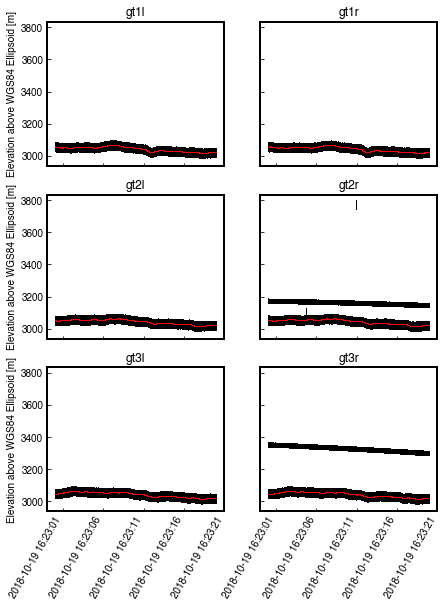

In [6]:
#-- create scatter plot of photon data (e.g., photon elevation vs UTC time)
ax = {}
f1,((ax['gt1l'],ax['gt1r']),(ax['gt2l'],ax['gt2r']),(ax['gt3l'],ax['gt3r'])) = \
    plt.subplots(num=1,nrows=3,ncols=2,sharex=True,sharey=True,figsize=(7,10))

#-- plot all elevations mapped to time in UTC
#-- for each beam
for gtx in IS2_atl03_beams:
    #-- data for beam gtx
    val = IS2_atl03_mds[gtx]
    #-- calculate photon event times and segment times as UTC
    #-- time of each Photon event (PE)
    gps_seconds = atlas_sdp_gps_epoch + val['heights']['delta_time']
    time_leaps = count_leaps(gps_seconds)
    time_ph = [gps_epoch + datetime.timedelta(seconds=s) for s in (gps_seconds-time_leaps)]
    #-- Photon event lat/lon and elevation (WGS84)
    ax[gtx].plot(time_ph,val['heights']['h_ph'],'k,')
    #-- plot mean elevation of high confidence photons
    ii, = np.nonzero(~Segment_Elev[gtx].mask)
    ax[gtx].plot(Segment_Time[gtx][ii],Segment_Elev[gtx][ii],'r,')
    #-- set title as beam
    ax[gtx].set_title(gtx)
    #-- adjust ticks
    ax[gtx].get_xaxis().set_tick_params(which='both',direction='in')
    ax[gtx].get_yaxis().set_tick_params(which='both',direction='in')
#-- add x and y labels
for gtx in ['gt3l','gt3r']:
    ax[gtx].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d %H:%M:%S'))
for gtx in ['gt1l','gt2l','gt3l']:
    ax[gtx].set_ylabel('Elevation above WGS84 Ellipsoid [m]')
#-- use auto-formatting for dates
f1.autofmt_xdate(rotation=60)
#-- show the plot
plt.show()

#### Plot moving average of elevation on a map projection

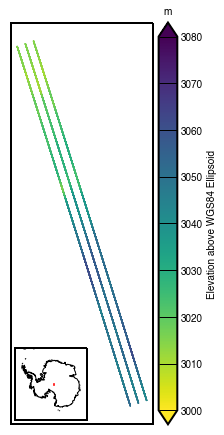

In [7]:
#-- overlay moving average of elevation on Antarctic mosaic
projection = ccrs.Stereographic(central_longitude=0.0,
    central_latitude=-90,true_scale_latitude=-71.0)
f2,ax2 = plt.subplots(num=2,figsize=(3,6),
    subplot_kw=dict(projection=projection))
#-- scatter plot parameters
vmin,vmax=(3000,3080)
cmap = cm.viridis_r
cmap.set_bad(alpha=0.0)
#-- for each beam
for gtx in IS2_atl03_beams:
    sc = ax2.scatter(Segment_Lon[gtx],Segment_Lat[gtx],
        c=Segment_Elev[gtx], s=0.1, cmap=cmap,
        vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
#-- set limits of plot
xmin,xmax = ax2.get_xlim()
ymin,ymax = ax2.get_ylim()
ax2.set_xlim(xmin,xmax)
ax2.set_ylim(ymin,ymax)
ax2.set_aspect('equal', adjustable='box')
ax2.get_xaxis().set_ticks([])
ax2.get_yaxis().set_ticks([])
#-- add inset map to show location of map extents
ax = plt.axes([0, 0, 1, 1], projection=projection)
ip = InsetPosition(ax2, [0.01,0.01,0.55,0.18])
ax.set_axes_locator(ip)
ax.fill(np.ravel([xmin,xmax,xmax,xmin]),np.ravel([ymin,ymin,ymax,ymax]),
    color='r', zorder=3, alpha=0.7)
ax.coastlines('50m')
ax.set_extent([-180,180,-90,-60],crs=ccrs.PlateCarree())
ax.set_aspect('equal', adjustable='box')
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])
#-- add colorbar
cbar = f2.colorbar(sc,ax=ax2,extend='both',extendfrac=0.0375,
    pad=0.03, drawedges=False)
cbar.solids.set_rasterized(True)
cbar.ax.tick_params(which='both', length=18, width=1, direction='in')
cbar.ax.set_ylabel('Elevation above WGS84 Ellipsoid')
cbar.ax.set_xlabel('m')
cbar.ax.xaxis.set_label_coords(0.50,1.04)
#-- stronger linewidth on frame
ax.outline_patch.set_linewidth(2.0)
ax2.outline_patch.set_linewidth(2.0)
#-- adjust subplot within figure
f2.subplots_adjust(left=0.02,right=0.85,bottom=0.02,top=0.95)
#-- show the plot
plt.show()

#### Create animation of histograms for a beam

In [8]:
#-- create histograms along each beam
gtx = 'gt1l'
val = IS2_atl03_mds['gt1l']
#-- number of ATL03 segments
n_seg = len(Segment_ID[gtx])
#-- polar stereographic projection
projection = ccrs.Stereographic(central_longitude=0.0,
    central_latitude=-90,true_scale_latitude=-71.0)

#-- create a histogram of the photon heights
f3 = plt.figure(num=3,figsize=(10,5))
gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 0.45])
ax3 = {}
ax3[0] = plt.subplot(gs[0])
ax3[1] = plt.subplot(gs[1], sharey=ax3[0])
ax3[2] = plt.subplot(gs[2], projection=projection)

#-- histogram parameters
w = 0.2
vmin,vmax=(3000,3100)
b1 = np.arange(vmin,vmax+w,w)
b2 = (b1[1:] + b1[0:-1])/2.0

#-- histogram of photon height
l1, = ax3[0].plot([],[],color='mediumseagreen')
l2, = ax3[0].plot([],[],color='darkorchid')
ax3[0].set_xlim(0,60)
ax3[0].set_ylim(vmin,vmax)
#-- plot of photon height
l3, = ax3[1].plot([],[],'.',color='mediumseagreen')
l4, = ax3[1].plot([],[],'.',color='darkorchid')
ax3[1].set_xlim(0,40)
#-- map of lat/lon location
ax3[2].plot(Segment_Lon[gtx], Segment_Lat[gtx],
    transform=ccrs.PlateCarree(), color='b', zorder=0)
for gt in sorted(set(['gt1l','gt2l','gt3l']) - set([gtx])):
    ax3[2].plot(Segment_Lon[gt], Segment_Lat[gt],
        transform=ccrs.PlateCarree(), color='0.5', zorder=0)
l5, = ax3[2].plot([], [], transform=ccrs.PlateCarree(),
    color='r', lw=3, zorder=1)
#-- set x and y labels
ax3[0].set_xlabel('Photon Event Count')
ax3[0].set_ylabel('Elevation above WGS84 Ellipsoid [m]')
ax3[1].set_xlabel('Along-Track Distance [m]')
#-- adjust ticks
plt.setp(ax3[1].get_yticklabels(), visible=False)
ax3[0].get_xaxis().set_tick_params(which='both',direction='in')
ax3[0].get_yaxis().set_tick_params(which='both',direction='in')
ax3[1].get_xaxis().set_tick_params(which='both',direction='in')
ax3[1].get_yaxis().set_tick_params(which='both',direction='in')
#-- set title as beam
ttl = f3.suptitle(None)
ax3[2].outline_patch.set_linewidth(2.0)
#-- adjust subplot within figure
f3.subplots_adjust(left=0.1,right=0.95,bottom=0.1,top=0.925,wspace=0.1)

#-- animate each segment
def animate_segments(j):
    #-- index for segment j
    idx = val['geolocation']['ph_index_beg'][j] - 1
    #-- number of photons in segment (use 2 ATL03 segments)
    c1 = np.copy(val['geolocation']['segment_ph_cnt'][j])
    c2 = np.copy(val['geolocation']['segment_ph_cnt'][j])
    cnt = c1 + c2
    #-- along-track X and Y coordinates    
    distance_along_X = np.copy(val['heights']['dist_ph_along'][idx:idx+cnt])
    distance_along_X[c1:] += Segment_Length[gtx][j]
    distance_along_Y = np.copy(val['heights']['dist_ph_across'][idx:idx+cnt])
    #-- photon height for segment
    h_ph = val['heights']['h_ph'][idx:idx+cnt]
    #-- latitude and longitude of segment
    segment_lats = val['heights']['lat_ph'][idx:idx+cnt]
    segment_lons = val['heights']['lon_ph'][idx:idx+cnt]
    #-- land ice signal confidence for segment
    ice_sig_conf = val['heights']['signal_conf_ph'][idx:idx+cnt,3]
    bg, = np.nonzero(ice_sig_conf <= 1)
    mc, = np.nonzero(ice_sig_conf >= 2)
    #-- histogram using numpy
    hbg,bbg = np.histogram(h_ph[bg],bins=b1)
    hmc,bmc = np.histogram(h_ph[mc],bins=b1)
    #-- set data for each empty plot
    l1.set_data(hbg,b2)
    l2.set_data(hmc,b2)
    l3.set_data(distance_along_X[bg],h_ph[bg])
    l4.set_data(distance_along_X[mc],h_ph[mc])
    l5.set_data(segment_lons, segment_lats)
    #-- set title text
    args = (PROD,YY,MM,DD,TRK,gtx,Segment_ID[gtx][j+1])
    ttl.set_text(('{0} {1}-{2}-{3}\t\t\tTrack {4}\t\t\t'
        'Beam {5}\t\t\tSegment {6:d}').format(*args))

#-- set animation
anim = animation.FuncAnimation(f3, animate_segments, frames=300)
%matplotlib inline
HTML(anim.to_jshtml())